# 3D Environment Reconstruction from 2D Images
## Classical SfM/MVS + 3D Gaussian Splatting on the DTU Robot Image Dataset

**Team:** Muhammad Taha (417609), Syed Adnan Aijaz Bukhari (432028), Talha Arshad (410179)
**Supervisors:** Dr. Shahid Ismail, LE Umair Khalil
**Course:** Computer Vision (CEP), DE-44, C&SE — NUST

### Pipeline
1. Load 64 projection matrices + 49 rectified images from DTU SampleSet
2. **Classical SfM** — SIFT → FLANN matching → 2-view + multi-view triangulation
3. **MVS densification** — plane-sweep stereo with NCC scoring
4. **3D Gaussian Splatting** — initialize from MVS, densify (clone/split/prune), optimize
5. **Export** — `.ply` + interactive HTML viewer


## 1 — Install Dependencies


In [1]:
import subprocess, sys

def pip(*pkgs):
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', *pkgs])

pip('opencv-contrib-python==4.10.0.84',
    'plyfile==1.0.3', 'open3d', 'tqdm', 'matplotlib', 'scipy', 'pillow')
pip('gsplat')                              # ~3-5 min CUDA compile on first run
print('All dependencies installed.')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.7/68.7 MB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 112.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 56.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 3.8 MB/s eta 0:00:00
All dependencies installed.


## 2 — Imports & GPU Check


In [2]:
import os, glob, time, json, math, warnings, random
from pathlib import Path
import numpy as np
import cv2
import torch
import torch.nn.functional as F
from torch import nn
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tqdm.auto import tqdm
from plyfile import PlyData, PlyElement
import open3d as o3d
warnings.filterwarnings('ignore')

# Reproducibility
np.random.seed(42); torch.manual_seed(42); random.seed(42)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device : {device}')
if device.type == 'cuda':
    print(f'GPU    : {torch.cuda.get_device_name(0)}')
    print(f'CUDA   : {torch.version.cuda}')
print(f'OpenCV : {cv2.__version__}')

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Device : cuda
GPU    : Tesla T4
CUDA   : 12.8
OpenCV : 4.10.0


## 3 — Configuration


In [3]:
# ── Dataset paths ────────────────────────────────────────────────────────
DATA_ROOT  = Path('/kaggle/input/datasets/tahaarif23/3d-reconstruction-dataset/data/SampleSet/MVS Data')
CALIB_DIR  = DATA_ROOT / 'Calibration' / 'cal18'
SCAN       = 'scan1'
SCAN_NUM   = int(''.join(c for c in str(SCAN) if c.isdigit()))   # 'scan1' → 1
RECT_DIR   = DATA_ROOT / 'Rectified' / SCAN

# ── Image / view selection ──────────────────────────────────────────────────
LIGHTING   = '3'
RESOLUTION = 'r5000'
N_VIEWS    = 49
VIEW_IDS   = list(range(1, N_VIEWS + 1))
IMG_SCALE  = 0.5                # 800x600 — good speed/quality tradeoff

# ── SfM hyperparameters ─────────────────────────────────────────────────────
SIFT_FEATURES   = 8000
MATCH_RATIO     = 0.8           # was 0.75 — slightly more permissive
MIN_MATCHES     = 25
RANSAC_REPROJ   = 4.0
MAX_PAIR_DIST   = 12            # was 8 — more pairs → more tracks
MIN_TRACK_LEN   = 2             # was 3 — accept 2-view tracks
MAX_REPROJ_ERR  = 6.0           # was 8 — but with 2-view tracks we want tighter

# ── MVS densification ───────────────────────────────────────────────────────
MVS_PATCH       = 7             # was 11 — smaller patch → more points
MVS_DEPTHS      = 96            # was 64 — finer depth resolution
MVS_STRIDE      = 4             # was 8 — denser sampling (4x more points)
MVS_MIN_VIEWS   = 2             # was 3
MVS_NCC_THRESH  = 0.3           # was 0.4 — accept slightly weaker matches
MVS_REF_STRIDE  = 3             # use every 3rd view as reference (was 4)

# ── Gaussian Splatting ──────────────────────────────────────────────────────
GS_ITERS         = 15000        # was 7000 — needs more time to converge
GS_LR_POS_INIT   = 0.00016
GS_LR_POS_FINAL  = 0.0000016    # exponential decay over training
GS_LR_OPACITY    = 0.05
GS_LR_SCALE      = 0.005
GS_LR_ROT        = 0.001
GS_LR_COLOR      = 0.0025

# Densification (the missing piece in v1)
GS_DENSIFY_FROM   = 500
GS_DENSIFY_UNTIL  = 7500
GS_DENSIFY_EVERY  = 100
GS_OPACITY_RESET  = 3000
GS_GRAD_THRESH    = 0.0002
GS_OPACITY_PRUNE  = 0.005
GS_SCALE_PRUNE    = 0.1         # fraction of scene extent

GS_LOG_EVERY     = 250
GS_RENDER_EVERY  = 1500

# ── Output ──────────────────────────────────────────────────────────────────
OUT_DIR = Path('/kaggle/working/output')
OUT_DIR.mkdir(parents=True, exist_ok=True)
(OUT_DIR / 'figures').mkdir(exist_ok=True)
(OUT_DIR / 'renders').mkdir(exist_ok=True)

print(f'Calibration : {CALIB_DIR}')
print(f'Images      : {RECT_DIR}')
print(f'Output      : {OUT_DIR}')

Calibration : /kaggle/input/datasets/tahaarif23/3d-reconstruction-dataset/data/SampleSet/MVS Data/Calibration/cal18
Images      : /kaggle/input/datasets/tahaarif23/3d-reconstruction-dataset/data/SampleSet/MVS Data/Rectified/scan1
Output      : /kaggle/working/output


### Helper: Interactive HTML Viewer Generator

Generates a self-contained HTML file with a Three.js point-cloud viewer. Used to produce a viewer for each `.ply` file we save (sparse, dense, dense-clean, Gaussian splat).


In [4]:
def make_html_viewer(pts, cols, out_path, title='3D Reconstruction', max_pts=300_000):
    n = len(pts)
    if n > max_pts:
        idx = np.random.choice(n, max_pts, replace=False)
        pts, cols = pts[idx], cols[idx]
    cu8 = (np.clip(cols, 0, 1) * 255).astype(np.uint8)
    pos = pts.astype(np.float32).flatten().tolist()
    col = (cu8.astype(np.float32) / 255.0).flatten().tolist()

    html = f"""<!DOCTYPE html>
<html><head><meta charset="UTF-8"><title>{title}</title>
<style>
body{{margin:0;overflow:hidden;background:#0a0a0a;font-family:-apple-system,system-ui,sans-serif;color:#eee}}
#info{{position:absolute;top:12px;left:12px;padding:12px 18px;background:rgba(0,0,0,0.7);border:1px solid #333;border-radius:8px;font-size:13px;line-height:1.6;backdrop-filter:blur(8px)}}
#info h1{{margin:0 0 6px 0;font-size:16px;font-weight:600}}
kbd{{background:#2a2a2a;border:1px solid #444;border-radius:4px;padding:1px 6px;font-size:11px}}
#stats{{position:absolute;bottom:12px;right:12px;padding:8px 14px;background:rgba(0,0,0,0.7);border:1px solid #333;border-radius:6px;font-size:11px;font-family:monospace}}
</style></head><body>
<div id="info"><h1>{title}</h1>
<div><kbd>Drag</kbd> orbit · <kbd>Scroll</kbd> zoom · <kbd>Right-drag</kbd> pan</div></div>
<div id="stats">{min(n, max_pts):,} points</div>
<script type="importmap">{{"imports":{{"three":"https://unpkg.com/three@0.160.0/build/three.module.js","three/addons/":"https://unpkg.com/three@0.160.0/examples/jsm/"}}}}</script>
<script type="module">
import * as THREE from 'three';
import {{OrbitControls}} from 'three/addons/controls/OrbitControls.js';
const scene=new THREE.Scene();scene.background=new THREE.Color(0x0a0a0a);
const positions=new Float32Array({pos});
const colors=new Float32Array({col});
const geom=new THREE.BufferGeometry();
geom.setAttribute('position',new THREE.BufferAttribute(positions,3));
geom.setAttribute('color',new THREE.BufferAttribute(colors,3));
geom.computeBoundingSphere();
const bs=geom.boundingSphere,c=bs.center.clone();
const mat=new THREE.PointsMaterial({{size:bs.radius*0.003,vertexColors:true,sizeAttenuation:true}});
scene.add(new THREE.Points(geom,mat));
const cam=new THREE.PerspectiveCamera(45,innerWidth/innerHeight,0.1,bs.radius*100);
cam.position.set(c.x+bs.radius*2,c.y+bs.radius*1.5,c.z+bs.radius*2);
const r=new THREE.WebGLRenderer({{antialias:true}});r.setSize(innerWidth,innerHeight);r.setPixelRatio(devicePixelRatio);
document.body.appendChild(r.domElement);
const ctrl=new OrbitControls(cam,r.domElement);ctrl.target.copy(c);ctrl.enableDamping=true;ctrl.dampingFactor=0.05;
addEventListener('resize',()=>{{cam.aspect=innerWidth/innerHeight;cam.updateProjectionMatrix();r.setSize(innerWidth,innerHeight)}});
(function a(){{requestAnimationFrame(a);ctrl.update();r.render(scene,cam)}})();
</script></body></html>"""
    with open(out_path, 'w') as f:
        f.write(html)


def save_ply_with_viewer(name, pts, cols, title=None):
    """Save a .ply and a matching .html viewer with the same base name."""
    ply_path  = OUT_DIR / f'{name}.ply'
    html_path = OUT_DIR / f'{name}.html'
    save_ply(ply_path, pts, cols)
    make_html_viewer(pts, cols, html_path,
                     title=title or f'DTU {SCAN} — {name}')
    print(f'  Saved: {ply_path.name}  +  {html_path.name}  ({len(pts):,} points)')


## 4 — Load Projection Matrices

Each `pos_XXX.txt` holds 12 values forming `P = K[R|t]`. We use OpenCV's
`decomposeProjectionMatrix` for robust K/R/t extraction.


In [5]:
def load_projection_matrix(view_id):
    path = CALIB_DIR / f'pos_{view_id:03d}.txt'
    with open(path) as f:
        vals = f.read().split()
    assert len(vals) == 12, f'Expected 12 values in {path}, got {len(vals)}'
    return np.array(vals, dtype=np.float64).reshape(3, 4)


def decompose_projection(P):
    """Use OpenCV's RQ decomposition — handles edge cases robustly."""
    K, R, t_homog = cv2.decomposeProjectionMatrix(P)[:3]
    t = t_homog[:3] / t_homog[3]            # de-homogenise
    t = t.flatten()
    K = K / K[2, 2]
    # Camera centre = -R^T @ (R @ C + t_world) ...
    # Here t_world from decompose is the camera centre in world coords already
    # so t = -R @ C  → C = -R^T @ t actually but we computed t from t_homog which IS C.
    # Use OpenCV convention: t_homog/t_homog[3] gives camera centre in world coords
    C = t.copy()
    # Compute world→camera translation
    t_wc = -R @ C
    return K, R, t_wc, C


print('Loading projection matrices...')
cameras = {}
for vid in VIEW_IDS:
    P = load_projection_matrix(vid)
    K, R, t, C = decompose_projection(P)

    # Scale intrinsics for downsampled images
    K_s = K.copy()
    K_s[0, 0] *= IMG_SCALE; K_s[1, 1] *= IMG_SCALE
    K_s[0, 2] *= IMG_SCALE; K_s[1, 2] *= IMG_SCALE
    P_s = K_s @ np.hstack([R, t.reshape(3, 1)])

    cameras[vid] = {'K': K, 'K_s': K_s, 'R': R, 't': t, 'C': C, 'P': P, 'P_s': P_s}

print(f'Loaded {len(cameras)} cameras.')
print(f'\nCamera 1 K:\n{np.round(cameras[1]["K"], 2)}')
print(f'Camera 1 centre: {np.round(cameras[1]["C"], 2)}')

Loading projection matrices...
Loaded 49 cameras.

Camera 1 K:
[[ 2.89233e+03 -0.00000e+00  8.23210e+02]
 [ 0.00000e+00  2.88318e+03  6.19070e+02]
 [ 0.00000e+00  0.00000e+00  1.00000e+00]]
Camera 1 centre: [190.83  -1.16  24.26]


## 5 — Visualize Camera Positions in 3D


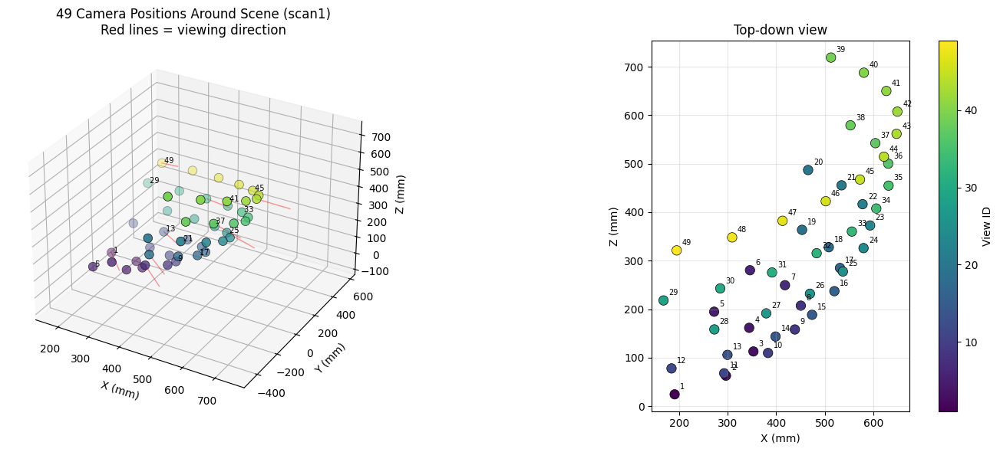

Saved: 01_camera_poses.png


In [6]:
fig = plt.figure(figsize=(15, 6))

ax1 = fig.add_subplot(121, projection='3d')
centres = np.array([cameras[v]['C'] for v in VIEW_IDS])
sc = ax1.scatter(centres[:, 0], centres[:, 1], centres[:, 2],
                 c=VIEW_IDS, cmap='viridis', s=70, edgecolors='black', linewidths=0.5)
for vid in VIEW_IDS[::4]:
    C = cameras[vid]['C']
    ax1.text(C[0], C[1], C[2], f' {vid}', fontsize=7)

# Look-at lines: camera viewing direction
for vid in VIEW_IDS[::6]:
    C = cameras[vid]['C']
    look = -cameras[vid]['R'][2] * 100
    ax1.plot([C[0], C[0]+look[0]], [C[1], C[1]+look[1]],
             [C[2], C[2]+look[2]], 'r-', alpha=0.4, linewidth=1)

ax1.set_xlabel('X (mm)'); ax1.set_ylabel('Y (mm)'); ax1.set_zlabel('Z (mm)')
ax1.set_title(f'49 Camera Positions Around Scene ({SCAN})\nRed lines = viewing direction')

ax2 = fig.add_subplot(122)
ax2.scatter(centres[:, 0], centres[:, 2], c=VIEW_IDS, cmap='viridis',
            s=80, edgecolors='black', linewidths=0.5)
for vid in VIEW_IDS:
    C = cameras[vid]['C']
    ax2.annotate(str(vid), (C[0], C[2]), fontsize=7,
                 textcoords='offset points', xytext=(5, 5))
ax2.set_xlabel('X (mm)'); ax2.set_ylabel('Z (mm)')
ax2.set_title('Top-down view'); ax2.set_aspect('equal'); ax2.grid(alpha=0.3)
plt.colorbar(sc, ax=ax2, label='View ID')

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '01_camera_poses.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: 01_camera_poses.png')

## 6 — Load Images


Loading images...


  0%|          | 0/49 [00:00<?, ?it/s]

Image size: 800 x 600 px (49 views)


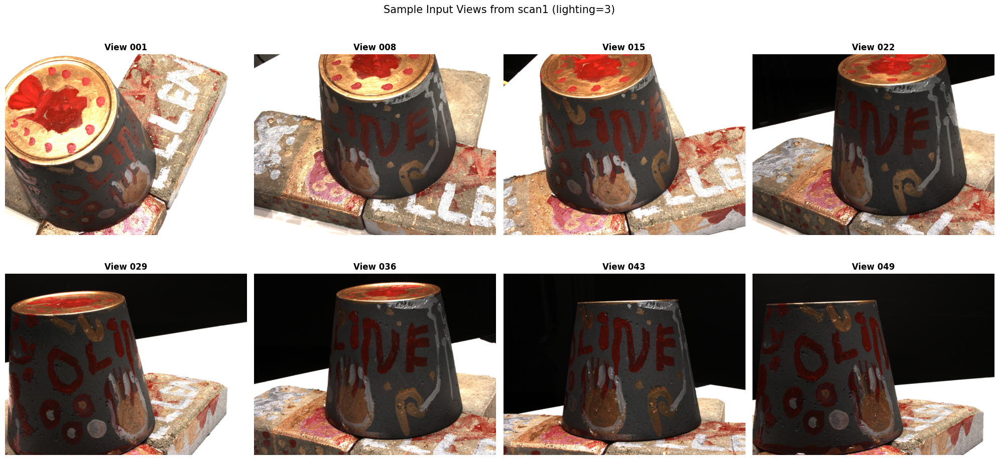

Saved: 02_sample_views.png


In [7]:
def load_image(view_id, lighting=LIGHTING, scale=IMG_SCALE):
    fname = f'rect_{view_id:03d}_{lighting}_{RESOLUTION}.png'
    img = cv2.imread(str(RECT_DIR / fname))
    assert img is not None, f'Could not load: {RECT_DIR / fname}'
    if scale != 1.0:
        h, w = img.shape[:2]
        img = cv2.resize(img, (int(w*scale), int(h*scale)), interpolation=cv2.INTER_AREA)
    return img


print('Loading images...')
images_rgb, images_gray = {}, {}
for vid in tqdm(VIEW_IDS):
    bgr = load_image(vid)
    images_rgb[vid]  = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    images_gray[vid] = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)

H, W = images_gray[1].shape
print(f'Image size: {W} x {H} px ({len(images_rgb)} views)')

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
for ax, vid in zip(axes.flat, [1, 8, 15, 22, 29, 36, 43, 49]):
    ax.imshow(images_rgb[vid]); ax.set_title(f'View {vid:03d}', fontweight='bold'); ax.axis('off')
plt.suptitle(f'Sample Input Views from {SCAN} (lighting={LIGHTING})', fontsize=15)
plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '02_sample_views.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: 02_sample_views.png')

## 7 — SIFT Feature Extraction


Extracting SIFT features (max 8000 per image)...


  0%|          | 0/49 [00:00<?, ?it/s]


Features: min=713, max=4125, mean=2292


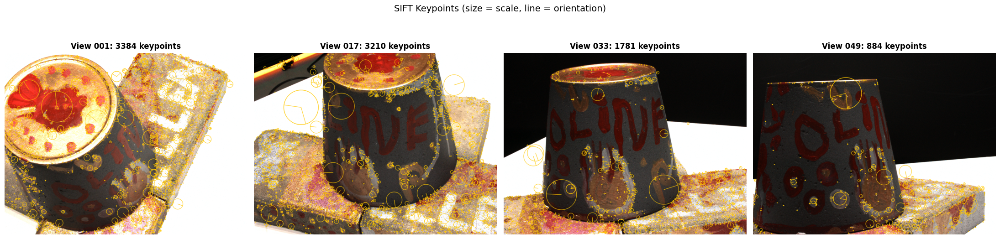

Saved: 03_sift_keypoints.png


In [8]:
sift = cv2.SIFT_create(nfeatures=SIFT_FEATURES, contrastThreshold=0.04, edgeThreshold=10)

print(f'Extracting SIFT features (max {SIFT_FEATURES} per image)...')
keypoints, descriptors = {}, {}
for vid in tqdm(VIEW_IDS):
    kp, des = sift.detectAndCompute(images_gray[vid], None)
    keypoints[vid], descriptors[vid] = kp, des

counts = [len(keypoints[v]) for v in VIEW_IDS]
print(f'\nFeatures: min={min(counts)}, max={max(counts)}, mean={np.mean(counts):.0f}')

fig, axes = plt.subplots(1, 4, figsize=(22, 6))
for ax, vid in zip(axes, [1, 17, 33, 49]):
    img_kp = cv2.drawKeypoints(images_rgb[vid], keypoints[vid], None,
                                color=(255, 200, 0),
                                flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    ax.imshow(img_kp)
    ax.set_title(f'View {vid:03d}: {len(keypoints[vid])} keypoints', fontweight='bold')
    ax.axis('off')
plt.suptitle('SIFT Keypoints (size = scale, line = orientation)', fontsize=14)
plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '03_sift_keypoints.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: 03_sift_keypoints.png')

## 8 — Feature Matching (FLANN + Lowe + RANSAC)


In [9]:
flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))


def match_pair(vid_a, vid_b):
    """Match SIFT features between two views with Lowe ratio + fundamental RANSAC."""
    da, db = descriptors[vid_a], descriptors[vid_b]
    if da is None or db is None: return []
    raw = flann.knnMatch(da, db, k=2)
    good = [m for pair in raw if len(pair) == 2
            for m, n in [pair] if m.distance < MATCH_RATIO * n.distance]
    if len(good) < MIN_MATCHES: return []
    pts_a = np.float32([keypoints[vid_a][m.queryIdx].pt for m in good])
    pts_b = np.float32([keypoints[vid_b][m.trainIdx].pt for m in good])
    F, mask = cv2.findFundamentalMat(pts_a, pts_b, cv2.FM_RANSAC, RANSAC_REPROJ, 0.999)
    if F is None or mask is None: return []
    return [g for g, ok in zip(good, mask.ravel()) if ok]


print('Matching feature pairs...')
matches_db = {}
pairs = [(a, b) for i, a in enumerate(VIEW_IDS)
         for b in VIEW_IDS[i+1:i+1+MAX_PAIR_DIST]]

for a, b in tqdm(pairs):
    m = match_pair(a, b)
    if len(m) >= MIN_MATCHES:
        matches_db[(a, b)] = m

total_matches = sum(len(m) for m in matches_db.values())
print(f'\nValid pairs   : {len(matches_db)}')
print(f'Total matches : {total_matches}')
print(f'Mean per pair : {total_matches / max(len(matches_db),1):.0f}')

Matching feature pairs...


  0%|          | 0/510 [00:00<?, ?it/s]


Valid pairs   : 355
Total matches : 95193
Mean per pair : 268


### Visualize Best Match Pair


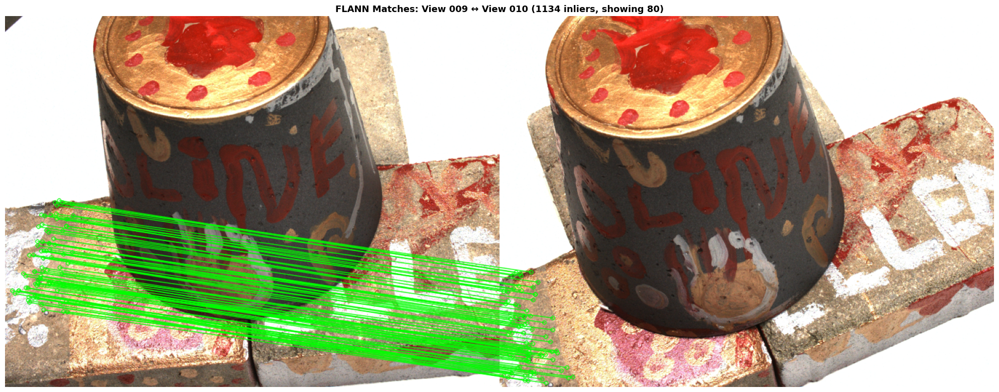

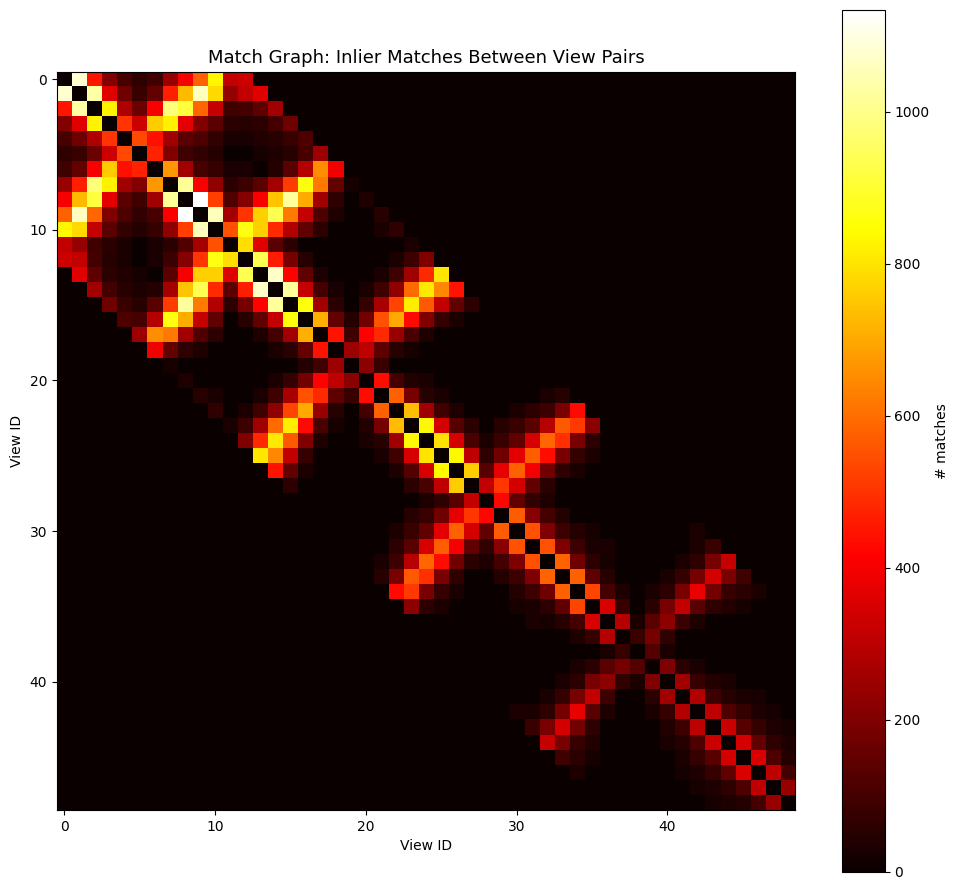

Saved: 04_match_example.png, 05_match_graph.png
Mean matches in connected pairs: 268, max: 1134


In [10]:
best = max(matches_db, key=lambda p: len(matches_db[p]))
a, b = best; m = matches_db[best]

img_match = cv2.drawMatches(
    images_rgb[a], keypoints[a], images_rgb[b], keypoints[b],
    m[:80], None, matchColor=(0, 255, 0), singlePointColor=(255, 0, 0),
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

fig, ax = plt.subplots(figsize=(20, 8))
ax.imshow(img_match)
ax.set_title(f'FLANN Matches: View {a:03d} ↔ View {b:03d} '
             f'({len(m)} inliers, showing 80)', fontsize=13, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '04_match_example.png', dpi=150, bbox_inches='tight')
plt.show()

# Match graph heatmap
M = np.zeros((N_VIEWS, N_VIEWS), dtype=int)
for (a, b), matches in matches_db.items():
    M[a-1, b-1] = M[b-1, a-1] = len(matches)

fig, ax = plt.subplots(figsize=(10, 9))
im = ax.imshow(M, cmap='hot', interpolation='nearest')
ax.set_xlabel('View ID'); ax.set_ylabel('View ID')
ax.set_title('Match Graph: Inlier Matches Between View Pairs', fontsize=13)
plt.colorbar(im, ax=ax, label='# matches')
plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '05_match_graph.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: 04_match_example.png, 05_match_graph.png')
print(f'Mean matches in connected pairs: {M[M>0].mean():.0f}, max: {M.max()}')

## 9 — Triangulation: Sparse Cloud (FIXED)

Two-step triangulation strategy:
1. **Pairwise triangulation** for every match → many points per pair
2. **Track-based filtering** to merge consistent observations

This avoids the v1 problem where strict track-length filtering threw away valid 2-view points.


In [11]:
def triangulate_two_view(vid_a, vid_b, matches):
    """Triangulate all matches between two views using cv2.triangulatePoints."""
    P_a, P_b = cameras[vid_a]['P_s'], cameras[vid_b]['P_s']
    pts_a = np.float32([keypoints[vid_a][m.queryIdx].pt for m in matches]).T  # (2, N)
    pts_b = np.float32([keypoints[vid_b][m.trainIdx].pt for m in matches]).T
    pts_4d = cv2.triangulatePoints(P_a, P_b, pts_a, pts_b)
    pts_3d = (pts_4d[:3] / pts_4d[3]).T                                       # (N, 3)
    return pts_3d, pts_a.T, pts_b.T


def reproj_error(X, P, x):
    """Reprojection error of a single 3D point against 2D obs."""
    xh = P @ np.append(X, 1)
    if abs(xh[2]) < 1e-8: return 1e9
    return np.hypot(xh[0]/xh[2] - x[0], xh[1]/xh[2] - x[1])


def in_front(X, R, t):
    """Check if 3D point is in front of camera (positive depth)."""
    return (R @ X + t)[2] > 0


print('Two-view triangulation for every matched pair...')
all_pts, all_cols, all_errs = [], [], []

for (a, b), matches in tqdm(matches_db.items()):
    pts_3d, pts_a, pts_b = triangulate_two_view(a, b, matches)

    # Filter: in front of both cameras + low reprojection error
    R_a, t_a = cameras[a]['R'], cameras[a]['t']
    R_b, t_b = cameras[b]['R'], cameras[b]['t']

    for i, X in enumerate(pts_3d):
        if not in_front(X, R_a, t_a) or not in_front(X, R_b, t_b):
            continue
        err_a = reproj_error(X, cameras[a]['P_s'], pts_a[i])
        err_b = reproj_error(X, cameras[b]['P_s'], pts_b[i])
        if max(err_a, err_b) > MAX_REPROJ_ERR:
            continue
        # Sample colour from view a
        u, v = pts_a[i]
        ui, vi = int(np.clip(u, 0, W-1)), int(np.clip(v, 0, H-1))
        all_pts.append(X)
        all_cols.append(images_rgb[a][vi, ui] / 255.0)
        all_errs.append((err_a + err_b) / 2)

all_pts  = np.array(all_pts)
all_cols = np.array(all_cols)
all_errs = np.array(all_errs)
print(f'\nRaw triangulated points    : {len(all_pts)}')
print(f'Mean reprojection error    : {all_errs.mean():.2f} px')

# Voxel-downsample to merge near-duplicate points (each track triangulated multiple times)
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(all_pts)
pcd.colors = o3d.utility.Vector3dVector(all_cols)
pcd = pcd.voxel_down_sample(voxel_size=1.0)               # 1mm grid
sparse_pts  = np.asarray(pcd.points)
sparse_cols = np.asarray(pcd.colors)
print(f'After voxel merge (1mm)    : {len(sparse_pts)} points')

# Remove statistical outliers
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(sparse_pts)
pcd.colors = o3d.utility.Vector3dVector(sparse_cols)
pcd, _ = pcd.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
sparse_pts  = np.asarray(pcd.points)
sparse_cols = np.asarray(pcd.colors)
print(f'After outlier removal      : {len(sparse_pts)} points')

Two-view triangulation for every matched pair...


  0%|          | 0/355 [00:00<?, ?it/s]


Raw triangulated points    : 94681
Mean reprojection error    : 0.22 px
After voxel merge (1mm)    : 30613 points
After outlier removal      : 30583 points


### Visualize Sparse Cloud


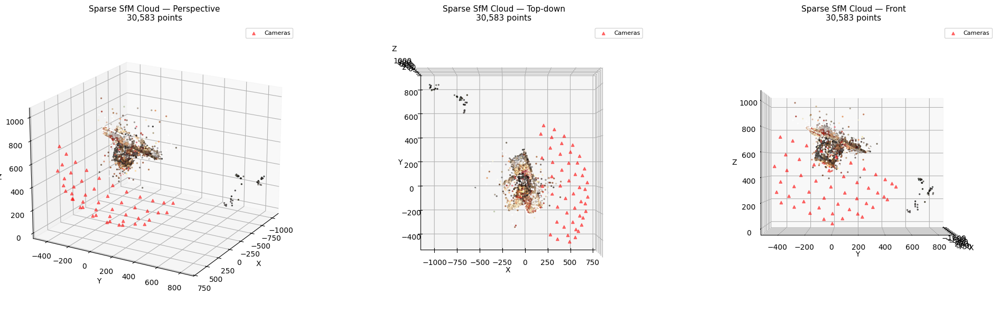

  Saved: sparse.ply  +  sparse.html  (30,583 points)
Saved: 06_sparse_cloud.png and sparse.ply + sparse.html


In [12]:
def plot_cloud_3angles(pts, cols, title, save_name):
    fig = plt.figure(figsize=(20, 6))
    angles = [(20, 30, 'Perspective'), (90, -90, 'Top-down'), (0, 0, 'Front')]
    for i, (elev, azim, sub) in enumerate(angles):
        ax = fig.add_subplot(1, 3, i+1, projection='3d')
        ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2], c=cols, s=2, alpha=0.7)
        cents = np.array([cameras[v]['C'] for v in VIEW_IDS])
        ax.scatter(cents[:, 0], cents[:, 1], cents[:, 2],
                   c='red', s=15, marker='^', alpha=0.5, label='Cameras')
        ax.view_init(elev=elev, azim=azim)
        ax.set_title(f'{title} — {sub}\n{len(pts):,} points', fontsize=11)
        ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
        ax.legend(loc='upper right', fontsize=8)
    plt.tight_layout()
    plt.savefig(OUT_DIR / 'figures' / save_name, dpi=150, bbox_inches='tight')
    plt.show()


plot_cloud_3angles(sparse_pts, sparse_cols, 'Sparse SfM Cloud', '06_sparse_cloud.png')


def save_ply(path, pts, cols):
    cols_u8 = (np.clip(cols, 0, 1) * 255).astype(np.uint8)
    vertex = np.zeros(len(pts), dtype=[('x','f4'),('y','f4'),('z','f4'),
                                       ('red','u1'),('green','u1'),('blue','u1')])
    vertex['x'], vertex['y'], vertex['z'] = pts[:,0], pts[:,1], pts[:,2]
    vertex['red'], vertex['green'], vertex['blue'] = cols_u8[:,0], cols_u8[:,1], cols_u8[:,2]
    PlyData([PlyElement.describe(vertex, 'vertex')], text=False).write(str(path))


save_ply_with_viewer('sparse', sparse_pts, sparse_cols,
                     title=f'DTU {SCAN} — Sparse SfM Cloud')
print(f'Saved: 06_sparse_cloud.png and sparse.ply + sparse.html')

## 10 — MVS Densification (FIXED)

Plane-sweep stereo: for each pixel in a reference view, sample candidate depths and pick
the one whose 3D point projects to most consistent patches across neighbour views.

Improvements over v1: smaller patches (7px), denser sampling (stride 4), more depth samples (96),
more reference views (every 3rd), looser NCC threshold (0.3).


In [13]:
def estimate_depth_range():
    """Estimate near/far depth from sparse cloud (per-camera)."""
    if len(sparse_pts) < 100:
        return 400.0, 1000.0
    depths = []
    for vid in VIEW_IDS:
        R, t = cameras[vid]['R'], cameras[vid]['t']
        pts_cam = (R @ sparse_pts.T + t.reshape(3, 1)).T
        depths.extend(pts_cam[pts_cam[:, 2] > 0, 2].tolist())
    depths = np.array(depths)
    return float(np.percentile(depths, 5)), float(np.percentile(depths, 95))


near, far = estimate_depth_range()
print(f'Estimated depth range: {near:.1f} … {far:.1f} mm')


def select_neighbours(ref_vid, k=4):
    ref_C = cameras[ref_vid]['C']
    others = sorted([v for v in VIEW_IDS if v != ref_vid],
                    key=lambda v: np.linalg.norm(cameras[v]['C'] - ref_C))
    return others[:k]

Estimated depth range: 541.0 … 786.6 mm


In [14]:
def plane_sweep_mvs(ref_vid, neighbours, near, far,
                    n_depths=MVS_DEPTHS, patch=MVS_PATCH,
                    stride=MVS_STRIDE, min_views=MVS_MIN_VIEWS,
                    ncc_thresh=MVS_NCC_THRESH):
    K_ref, R_ref, t_ref = cameras[ref_vid]['K_s'], cameras[ref_vid]['R'], cameras[ref_vid]['t']
    img_ref      = images_gray[ref_vid].astype(np.float32) / 255.0
    img_ref_rgb  = images_rgb[ref_vid] / 255.0
    H_img, W_img = img_ref.shape
    half = patch // 2

    # Pixel grid
    ys = np.arange(half, H_img - half, stride)
    xs = np.arange(half, W_img - half, stride)
    yy, xx = np.meshgrid(ys, xs, indexing='ij')
    pixels = np.stack([xx.flatten(), yy.flatten()], axis=1)

    # Inverse-depth sampling (uniform in 1/d gives more samples nearby)
    inv_n, inv_f = 1.0 / near, 1.0 / far
    depth_samples = 1.0 / np.linspace(inv_n, inv_f, n_depths)

    # Reference rays
    K_inv = np.linalg.inv(K_ref)
    pix_h = np.hstack([pixels, np.ones((len(pixels), 1))])
    rays_cam = (K_inv @ pix_h.T).T
    rays_cam = rays_cam / rays_cam[:, 2:3]              # normalise z=1

    # Reference patches (vectorised extraction)
    P = len(pixels)
    ref_patches = np.zeros((P, patch, patch), dtype=np.float32)
    for i, (x, y) in enumerate(pixels):
        ref_patches[i] = img_ref[y-half:y+half+1, x-half:x+half+1]
    rm = ref_patches.mean(axis=(1, 2), keepdims=True)
    rs = ref_patches.std(axis=(1, 2), keepdims=True) + 1e-6
    ref_norm = (ref_patches - rm) / rs

    # Pre-load neighbour images
    nbr_imgs = [images_gray[n].astype(np.float32) / 255.0 for n in neighbours]
    nbr_Ps   = [cameras[n]['P_s'] for n in neighbours]

    best_score = np.full(P, -np.inf, dtype=np.float32)
    best_depth = np.zeros(P, dtype=np.float32)
    best_nvalid = np.zeros(P, dtype=np.int32)

    for d in depth_samples:
        pts_ref_cam = rays_cam * d
        pts_world = (R_ref.T @ (pts_ref_cam.T - t_ref.reshape(3, 1))).T

        scores = np.zeros((P, len(neighbours)), dtype=np.float32)
        valids = np.zeros((P, len(neighbours)), dtype=bool)

        for ni, (P_n, img_n) in enumerate(zip(nbr_Ps, nbr_imgs)):
            ph = np.hstack([pts_world, np.ones((P, 1))])
            proj = (P_n @ ph.T).T
            valid = proj[:, 2] > 0
            uv = proj[:, :2] / np.where(valid[:, None], proj[:, 2:3], 1)
            u, v = uv[:, 0], uv[:, 1]
            ok = valid & (u > half) & (u < W_img - half) & (v > half) & (v < H_img - half)
            idxs = np.where(ok)[0]

            for idx in idxs:
                xi, yi = int(round(u[idx])), int(round(v[idx]))
                pn = img_n[yi-half:yi+half+1, xi-half:xi+half+1]
                if pn.shape != (patch, patch): continue
                pnm, pns = pn.mean(), pn.std() + 1e-6
                ncc = (ref_norm[idx] * (pn - pnm) / pns).mean()
                scores[idx, ni] = ncc
                valids[idx, ni] = True

        n_valid = valids.sum(axis=1)
        avg = np.where(n_valid > 0, scores.sum(axis=1) / np.maximum(n_valid, 1), -np.inf)
        better = (avg > best_score) & (n_valid >= min_views)
        best_score[better] = avg[better]
        best_depth[better] = d
        best_nvalid[better] = n_valid[better]

    keep = (best_score > ncc_thresh) & (best_depth > 0)
    pts_cam_kept = rays_cam[keep] * best_depth[keep, None]
    pts_world = (R_ref.T @ (pts_cam_kept.T - t_ref.reshape(3, 1))).T
    cols = np.array([img_ref_rgb[int(p[1]), int(p[0])] for p in pixels[keep]])
    return pts_world, cols


print('Running plane-sweep MVS densification...')
ref_views = VIEW_IDS[::MVS_REF_STRIDE]
print(f'  {len(ref_views)} reference views: {ref_views}')

dense_chunks_pts, dense_chunks_cols = [], []
for ref in tqdm(ref_views):
    nb = select_neighbours(ref, k=4)
    pts, cols = plane_sweep_mvs(ref, nb, near, far)
    dense_chunks_pts.append(pts)
    dense_chunks_cols.append(cols)

dense_pts  = np.vstack(dense_chunks_pts)
dense_cols = np.vstack(dense_chunks_cols)
print(f'\nDense raw            : {len(dense_pts)} points')

# Statistical outlier filter
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(dense_pts)
pcd.colors = o3d.utility.Vector3dVector(dense_cols)
pcd = pcd.voxel_down_sample(voxel_size=1.5)
pcd, _ = pcd.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
dense_pts  = np.asarray(pcd.points)
dense_cols = np.asarray(pcd.colors)
print(f'After voxel + outlier: {len(dense_pts)} points')

Running plane-sweep MVS densification...
  17 reference views: [1, 4, 7, 10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 43, 46, 49]


  0%|          | 0/17 [00:00<?, ?it/s]


Dense raw            : 343438 points
After voxel + outlier: 166303 points


### Visualize Sparse vs Dense


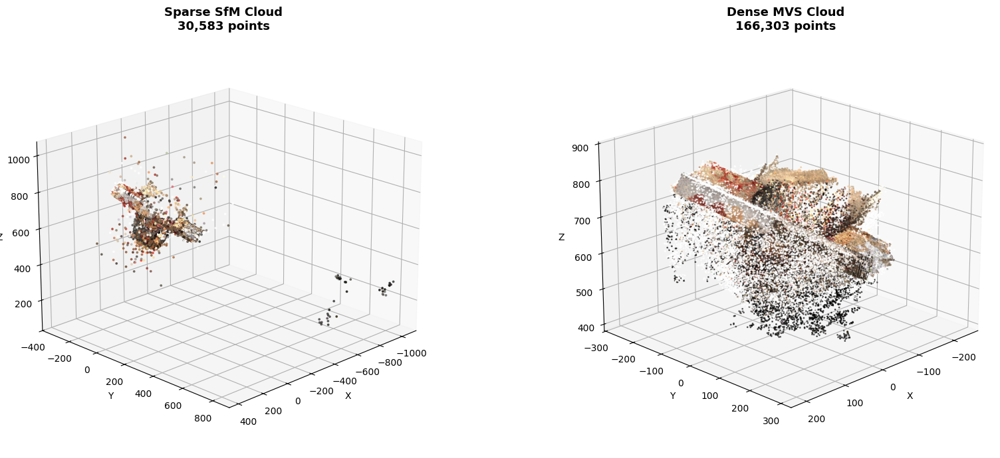

  Saved: dense.ply  +  dense.html  (166,303 points)


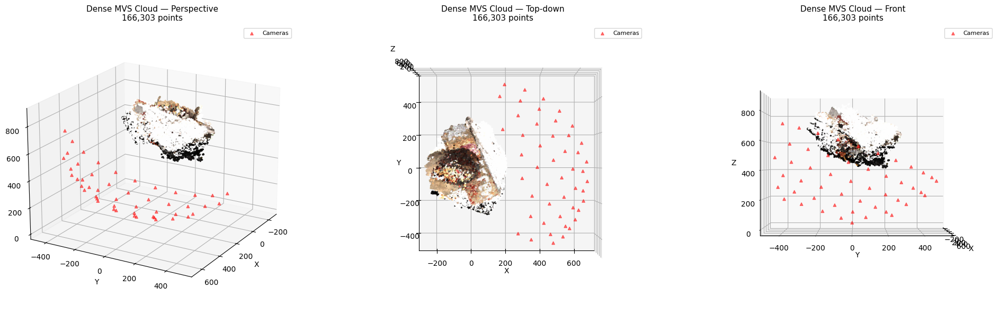

Saved: 07_sparse_vs_dense.png, 08_dense_cloud.png, dense.ply + dense.html


In [15]:
fig = plt.figure(figsize=(18, 7))
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(sparse_pts[:,0], sparse_pts[:,1], sparse_pts[:,2],
            c=sparse_cols, s=3, alpha=0.7)
ax1.set_title(f'Sparse SfM Cloud\n{len(sparse_pts):,} points', fontsize=13, fontweight='bold')
ax1.view_init(elev=20, azim=45)
ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z')

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(dense_pts[:,0], dense_pts[:,1], dense_pts[:,2],
            c=dense_cols, s=1, alpha=0.6)
ax2.set_title(f'Dense MVS Cloud\n{len(dense_pts):,} points', fontsize=13, fontweight='bold')
ax2.view_init(elev=20, azim=45)
ax2.set_xlabel('X'); ax2.set_ylabel('Y'); ax2.set_zlabel('Z')

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '07_sparse_vs_dense.png', dpi=150, bbox_inches='tight')
plt.show()

save_ply_with_viewer('dense', dense_pts, dense_cols,
                     title=f'DTU {SCAN} — Dense MVS Cloud')
plot_cloud_3angles(dense_pts, dense_cols, 'Dense MVS Cloud', '08_dense_cloud.png')
print('Saved: 07_sparse_vs_dense.png, 08_dense_cloud.png, dense.ply + dense.html')

## 10b — Dense Cloud Cleanup (Dilated ObsMask + SOR + Radius Filter)

The raw MVS dense cloud (~166k points) contains three kinds of noise:
1. **Background plane** — turntable and walls reconstructed alongside the object
2. **Scattered outliers** — isolated points from photo-consistency errors at edges
3. **Floating halo** — points just outside the surface from depth-fusion artifacts

We apply three filters in sequence:

| Filter | Purpose | Source |
|---|---|---|
| **Dilated ObsMask** | Restrict to evaluation volume + 50mm buffer (kills background, preserves object) | `ObsMask{N}_10.mat` |
| **Statistical Outlier Removal** | Remove points with statistically-distant neighbours | Open3D |
| **Radius outlier filter** | Remove points with too few neighbours within a radius | Open3D |

**Why dilate the mask?** The DTU ObsMask is sized for the GT scanner's high-confidence volume — it can clip the topmost surface of objects that extend slightly beyond. Dilating by 50mm adds a buffer that preserves the full object while still removing distant background.

**Field names in the `.mat` file:**
- `ObsMask` — 3D binary volume
- `BB` — 2×3 bounding box `[[xmin, ymin, zmin], [xmax, ymax, zmax]]` in mm
- `Res` — voxel resolution (1 mm)
- `Margin` — padding around object (10 mm, gives the `_10` in filename)
- `cSet` — scan ID

**Tuning knob:** if cleanup still clips the object → raise `MASK_DILATE_MM` to 80 or 100. If background creeps back → drop to 30.


In [16]:
import scipy.io as sio
from scipy.ndimage import binary_dilation

# ─── Config ──────────────────────────────────────────────────────────────────
SCAN_NUM = int(''.join(c for c in str(SCAN) if c.isdigit()))
OBS_MASK_PATH = DATA_ROOT / 'ObsMask' / f'ObsMask{SCAN_NUM}_10.mat'

# Mask dilation — adds a buffer zone around the DTU evaluation volume so
# legitimate object surface near the edges (e.g. top of cylinder) isn't clipped.
MASK_DILATE_MM   = 50

# Filter parameters
SOR_NB_NEIGHBORS = 20
SOR_STD_RATIO    = 2.0
RADIUS_NB_POINTS = 5
RADIUS_VALUE     = 15.0

# ─── 1. Load + Dilate ObsMask ────────────────────────────────────────────────
print(f'Loading: {OBS_MASK_PATH.name}')
mat = sio.loadmat(str(OBS_MASK_PATH))

obs_volume_raw = mat['ObsMask'].astype(bool)
BB             = mat['BB'].astype(np.float32)
res            = float(mat['Res'].squeeze())
margin         = int(mat['Margin'].squeeze())
scan_id        = int(mat['cSet'].squeeze())

print(f'  Mask volume shape : {obs_volume_raw.shape}')
print(f'  Voxel resolution  : {res} mm')
print(f'  Scan ID           : {scan_id}  (expected {SCAN_NUM})')
print(f'  Original BB       : {BB[0]} … {BB[1]}')
print(f'  Original BB span  : {BB[1] - BB[0]} mm')
assert scan_id == SCAN_NUM, f'Mask cSet={scan_id} but SCAN_NUM={SCAN_NUM} — wrong file!'

# Dilate the mask in voxel space
dilate_voxels = int(MASK_DILATE_MM / res)
print(f'\n  Dilating mask by {MASK_DILATE_MM}mm ({dilate_voxels} voxels)...')

# Pad the volume first so dilation can extend beyond the original BB
pad = dilate_voxels + 5
obs_padded = np.pad(obs_volume_raw, pad, mode='constant', constant_values=False)
obs_dilated = binary_dilation(obs_padded, iterations=dilate_voxels)

# Update BB to account for padding
BB_padded = BB.copy()
BB_padded[0] -= pad * res
BB_padded[1] += pad * res

print(f'  Original mask voxels : {obs_volume_raw.sum():,}')
print(f'  Dilated mask voxels  : {obs_dilated.sum():,}  '
      f'(+{(obs_dilated.sum() - obs_volume_raw.sum()) / max(obs_volume_raw.sum(),1) * 100:.1f}%)')
print(f'  Padded BB span       : {BB_padded[1] - BB_padded[0]} mm')

obs_volume = obs_dilated  # use dilated mask going forward

# ─── 2. Vectorised mask check ────────────────────────────────────────────────
def points_in_mask(pts):
    """Return boolean array of length N indicating which points are inside the
    DTU observability volume (after dilation)."""
    bb_min = BB_padded[0]
    idx = np.floor((pts - bb_min) / res).astype(np.int32)
    shape = np.array(obs_volume.shape)
    inside = np.all((idx >= 0) & (idx < shape), axis=1)
    keep = np.zeros(len(pts), dtype=bool)
    valid = idx[inside]
    keep[inside] = obs_volume[valid[:, 0], valid[:, 1], valid[:, 2]] > 0
    return keep

# Reload the raw dense cloud from disk so this cell is idempotent (re-runnable)
raw_pcd  = o3d.io.read_point_cloud(str(OUT_DIR / 'dense.ply'))
dense_pts  = np.asarray(raw_pcd.points)
dense_cols = np.asarray(raw_pcd.colors)

print(f'\n[1/3] Dilated ObsMask filter')
print(f'  Before     : {len(dense_pts):,} points')
mask_keep = points_in_mask(dense_pts)
dense_pts_m  = dense_pts[mask_keep]
dense_cols_m = dense_cols[mask_keep]
pct_kept = mask_keep.sum() / max(1, len(mask_keep)) * 100
print(f'  After mask : {len(dense_pts_m):,} points  ({pct_kept:.1f}% kept)')

if len(dense_pts_m) < 0.05 * len(dense_pts):
    print('  ⚠️  Mask removed >95% of points — falling back to no-mask cleanup.')
    dense_pts_m  = dense_pts.copy()
    dense_cols_m = dense_cols.copy()

# ─── 3. Statistical Outlier Removal ──────────────────────────────────────────
print(f'\n[2/3] Statistical Outlier Removal (k={SOR_NB_NEIGHBORS}, std={SOR_STD_RATIO})')
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(dense_pts_m)
pcd.colors = o3d.utility.Vector3dVector(dense_cols_m)
pcd, _ = pcd.remove_statistical_outlier(
    nb_neighbors=SOR_NB_NEIGHBORS,
    std_ratio=SOR_STD_RATIO,
)
print(f'  After SOR  : {len(pcd.points):,} points')

# ─── 4. Radius Outlier Filter ────────────────────────────────────────────────
print(f'\n[3/3] Radius Outlier Filter (min_pts={RADIUS_NB_POINTS}, r={RADIUS_VALUE}mm)')
pcd, _ = pcd.remove_radius_outlier(
    nb_points=RADIUS_NB_POINTS,
    radius=RADIUS_VALUE,
)
dense_pts  = np.asarray(pcd.points)
dense_cols = np.asarray(pcd.colors)
print(f'  After radius: {len(dense_pts):,} points')

# Save the cleaned cloud
save_ply_with_viewer('dense_clean', dense_pts, dense_cols,
                     title=f'DTU {SCAN} — Dense MVS Cloud (Cleaned)')
print(f'\n✅ Saved: dense_clean.ply + dense_clean.html  ({len(dense_pts):,} points)')


Loading: ObsMask1_10.mat
  Mask volume shape : (185, 351, 311)
  Voxel resolution  : 1.0 mm
  Scan ID           : 1  (expected 1)
  Original BB       : [ -55. -176.  495.] … [128. 173. 804.]
  Original BB span  : [183. 349. 309.] mm

  Dilating mask by 50mm (50 voxels)...
  Original mask voxels : 9,365,566
  Dilated mask voxels  : 30,959,238  (+230.6%)
  Padded BB span       : [293. 459. 419.] mm

[1/3] Dilated ObsMask filter
  Before     : 166,303 points
  After mask : 142,465 points  (85.7% kept)

[2/3] Statistical Outlier Removal (k=20, std=2.0)
  After SOR  : 130,153 points

[3/3] Radius Outlier Filter (min_pts=5, r=15.0mm)
  After radius: 130,029 points
  Saved: dense_clean.ply  +  dense_clean.html  (130,029 points)

✅ Saved: dense_clean.ply + dense_clean.html  (130,029 points)


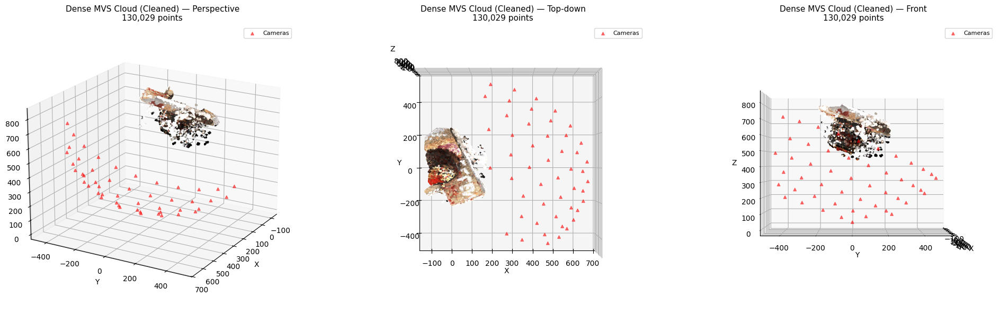

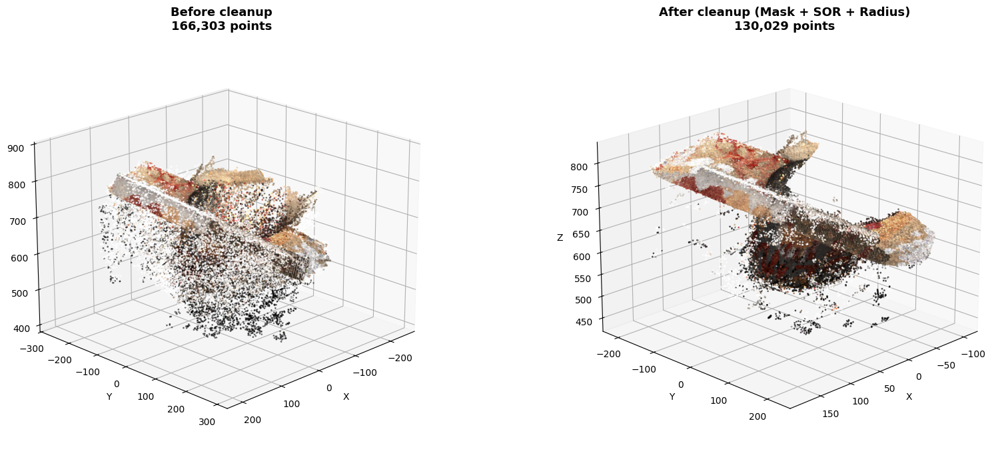


Cleanup summary:
  Raw dense cloud   : 166,303 points
  Cleaned cloud     : 130,029 points
  Removed           : 36,274 points  (21.8%)


In [17]:
# Three-angle view of the cleaned dense cloud
plot_cloud_3angles(
    dense_pts, dense_cols,
    'Dense MVS Cloud (Cleaned)',
    '08b_dense_cleaned.png',
)

# Before/after side-by-side comparison
import matplotlib.pyplot as plt

# Reload the unfiltered cloud from disk for a fair comparison
raw_pcd = o3d.io.read_point_cloud(str(OUT_DIR / 'dense.ply'))
raw_pts  = np.asarray(raw_pcd.points)
raw_cols = np.asarray(raw_pcd.colors)

fig = plt.figure(figsize=(18, 7))

ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(raw_pts[:,0], raw_pts[:,1], raw_pts[:,2],
            c=raw_cols, s=1, alpha=0.5)
ax1.set_title(f'Before cleanup\n{len(raw_pts):,} points',
              fontsize=13, fontweight='bold')
ax1.view_init(elev=20, azim=45)
ax1.set_xlabel('X'); ax1.set_ylabel('Y'); ax1.set_zlabel('Z')

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(dense_pts[:,0], dense_pts[:,1], dense_pts[:,2],
            c=dense_cols, s=1, alpha=0.6)
ax2.set_title(f'After cleanup (Mask + SOR + Radius)\n{len(dense_pts):,} points',
              fontsize=13, fontweight='bold')
ax2.view_init(elev=20, azim=45)
ax2.set_xlabel('X'); ax2.set_ylabel('Y'); ax2.set_zlabel('Z')

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '08c_cleanup_comparison.png',
            dpi=150, bbox_inches='tight')
plt.show()

# Print summary statistics
removed = len(raw_pts) - len(dense_pts)
pct_removed = removed / len(raw_pts) * 100
print(f'\nCleanup summary:')
print(f'  Raw dense cloud   : {len(raw_pts):,} points')
print(f'  Cleaned cloud     : {len(dense_pts):,} points')
print(f'  Removed           : {removed:,} points  ({pct_removed:.1f}%)')


## 11 — 3D Gaussian Splatting (FIXED)

Each Gaussian has: position, scale (3D), rotation (quaternion), opacity, RGB colour.

**Critical fix**: the v1 notebook was missing the **densification loop**. The original 3DGS paper
splits big Gaussians, clones small ones, and prunes low-opacity ones every 100 iterations.
Without this, Gaussians stay as huge blobs.


In [18]:
from gsplat.rendering import rasterization
from scipy.spatial import cKDTree


def init_gaussians(pts, cols, scene_extent):
    """Initialize Gaussians from a point cloud with proper scale estimation."""
    pts  = pts.astype(np.float32)
    cols = cols.astype(np.float32)
    n = len(pts)

    # Per-point scale from k-NN distance (avg of 3 nearest neighbours)
    tree = cKDTree(pts)
    d, _ = tree.query(pts, k=4)
    knn_dist = d[:, 1:].mean(axis=1)
    knn_dist = np.clip(knn_dist, 1e-3, scene_extent / 10)
    log_scales = np.log(knn_dist).astype(np.float32)
    scales = np.tile(log_scales[:, None], (1, 3))           # (N, 3) isotropic init

    quats = np.zeros((n, 4), dtype=np.float32)
    quats[:, 0] = 1.0                                       # identity (w=1)
    opacities = np.full(n, np.log(0.1 / (1 - 0.1)),         # inverse-sigmoid(0.1)
                       dtype=np.float32)

    return {
        'means':     torch.tensor(pts,        device=device, requires_grad=True),
        'scales':    torch.tensor(scales,     device=device, requires_grad=True),
        'quats':     torch.tensor(quats,      device=device, requires_grad=True),
        'opacities': torch.tensor(opacities,  device=device, requires_grad=True),
        'colors':    torch.tensor(cols,       device=device, requires_grad=True),
    }


# Compute scene extent (used for scale clamping & densification)
scene_centre = dense_pts.mean(axis=0)
scene_extent = np.linalg.norm(dense_pts - scene_centre, axis=1).max()
print(f'Scene extent: {scene_extent:.1f} mm')

# Initialize from MVS dense cloud
gauss = init_gaussians(dense_pts, dense_cols, scene_extent)
print(f'Initialized {gauss["means"].shape[0]:,} Gaussians from MVS')

Scene extent: 261.9 mm
Initialized 130,029 Gaussians from MVS


In [19]:
def quat_norm(q):
    return q / (q.norm(dim=-1, keepdim=True) + 1e-8)


def render_view(g, vid, W_img, H_img):
    K = torch.from_numpy(cameras[vid]['K_s']).float().to(device)
    R = torch.from_numpy(cameras[vid]['R']).float().to(device)
    t = torch.from_numpy(cameras[vid]['t']).float().to(device)
    viewmat = torch.eye(4, device=device)
    viewmat[:3, :3] = R
    viewmat[:3, 3]  = t
    rendered, _, _ = rasterization(
        means=g['means'], quats=quat_norm(g['quats']),
        scales=torch.exp(g['scales']),
        opacities=torch.sigmoid(g['opacities']).squeeze(),
        colors=torch.clamp(g['colors'], 0.0, 1.0),
        viewmats=viewmat.unsqueeze(0), Ks=K.unsqueeze(0),
        width=W_img, height=H_img, render_mode='RGB', packed=False)
    return rendered[0]                                       # (H, W, 3)


# Sanity check
with torch.no_grad():
    test = render_view(gauss, 1, W, H)
    print(f'Test render: {tuple(test.shape)}, range [{test.min():.3f}, {test.max():.3f}]')

Output()

gsplat: CUDA extension has been set up successfully in 331.09 seconds.

Test render: (600, 800, 3), range [0.000, 0.920]


### Densification Loop

This is the core fix. Every 100 iters from iter 500-7500 we:
- **Clone**: duplicate small Gaussians whose position gradient is high (under-reconstructed)
- **Split**: split big Gaussians whose position gradient is high (over-reconstructed)
- **Prune**: remove low-opacity Gaussians (transparent → useless) and oversized ones


In [20]:
def make_optimizer(g, lr_pos):
    return torch.optim.Adam([
        {'params': [g['means']],     'lr': lr_pos,        'name': 'means'},
        {'params': [g['scales']],    'lr': GS_LR_SCALE,   'name': 'scales'},
        {'params': [g['quats']],     'lr': GS_LR_ROT,     'name': 'quats'},
        {'params': [g['opacities']], 'lr': GS_LR_OPACITY, 'name': 'opacities'},
        {'params': [g['colors']],    'lr': GS_LR_COLOR,   'name': 'colors'},
    ], eps=1e-15)


def cat_grads(grad_accum, count_accum):
    """Mean position gradient (in 2D screen space proxy) per Gaussian."""
    safe = torch.clamp(count_accum, min=1)
    return grad_accum / safe


def densify_and_prune(g, opt, grad_accum, count_accum, scene_extent,
                      grad_thresh=GS_GRAD_THRESH,
                      opacity_thresh=GS_OPACITY_PRUNE,
                      scale_thresh_frac=GS_SCALE_PRUNE):
    """Clone small + split large + prune transparent/huge Gaussians."""
    with torch.no_grad():
        means     = g['means']
        scales    = torch.exp(g['scales'])
        quats     = quat_norm(g['quats'])
        opacities = torch.sigmoid(g['opacities'])
        colors    = g['colors']

        max_scale = scales.max(dim=1).values
        big = max_scale > 0.01 * scene_extent

        avg_grad = cat_grads(grad_accum, count_accum).squeeze()
        high_grad = avg_grad > grad_thresh

        # ── Prune ───────────────────────────────────────────────────────────
        too_small_opacity = opacities.squeeze() < opacity_thresh
        too_large = max_scale > scale_thresh_frac * scene_extent
        prune_mask = too_small_opacity | too_large

        keep = ~prune_mask
        means     = means[keep]
        scales_l  = g['scales'][keep]
        quats_l   = g['quats'][keep]
        opacities_l = g['opacities'][keep]
        colors_l  = g['colors'][keep]

        if grad_accum is not None:
            grad_accum  = grad_accum[keep]
            count_accum = count_accum[keep]
        avg_grad   = avg_grad[keep]
        max_scale  = max_scale[keep]
        big        = big[keep]
        high_grad  = high_grad[keep]

        # ── Clone (small + high-grad): duplicate ────────────────────────────
        clone_mask = high_grad & ~big
        if clone_mask.sum() > 0:
            new_means     = means[clone_mask].clone()
            new_scales    = scales_l[clone_mask].clone()
            new_quats     = quats_l[clone_mask].clone()
            new_opacities = opacities_l[clone_mask].clone()
            new_colors    = colors_l[clone_mask].clone()

            means     = torch.cat([means,     new_means])
            scales_l  = torch.cat([scales_l,  new_scales])
            quats_l   = torch.cat([quats_l,   new_quats])
            opacities_l = torch.cat([opacities_l, new_opacities])
            colors_l  = torch.cat([colors_l,  new_colors])

        # ── Split (big + high-grad): replace with 2 smaller copies ─────────
        split_mask = high_grad & big
        if split_mask.sum() > 0:
            sel_means  = means[split_mask]
            sel_scales = scales_l[split_mask]
            sel_quats  = quats_l[split_mask]
            sel_op     = opacities_l[split_mask]
            sel_col    = colors_l[split_mask]

            # Two children offset by random direction × scale
            stds = torch.exp(sel_scales)
            rand_a = torch.randn_like(sel_means) * stds
            rand_b = -rand_a
            child_a = sel_means + rand_a
            child_b = sel_means + rand_b

            scale_factor = math.log(1.6)                     # original paper: divide by 1.6
            new_scales = sel_scales - scale_factor

            # Remove parents
            keep_split = ~split_mask
            means     = torch.cat([means[keep_split],     child_a, child_b])
            scales_l  = torch.cat([scales_l[keep_split],  new_scales, new_scales])
            quats_l   = torch.cat([quats_l[keep_split],   sel_quats, sel_quats])
            opacities_l = torch.cat([opacities_l[keep_split], sel_op, sel_op])
            colors_l  = torch.cat([colors_l[keep_split],  sel_col, sel_col])

        # Build fresh leaf tensors with grad
        new_g = {
            'means':     means.detach().requires_grad_(True),
            'scales':    scales_l.detach().requires_grad_(True),
            'quats':     quats_l.detach().requires_grad_(True),
            'opacities': opacities_l.detach().requires_grad_(True),
            'colors':    colors_l.detach().requires_grad_(True),
        }
    return new_g


def reset_opacity(g):
    """Reset opacity to a low value to let optimizer rediscover important Gaussians."""
    with torch.no_grad():
        target = math.log(0.01 / (1 - 0.01))
        g['opacities'].data.fill_(target)
    return g

### Training Loop


In [21]:
opt = make_optimizer(gauss, GS_LR_POS_INIT)


def l1(a, b): return (a - b).abs().mean()


def ssim_simple(a, b):
    """Simple SSIM — sufficient for our loss (full SSIM via convs is slower)."""
    mu_a, mu_b = a.mean(), b.mean()
    va = ((a - mu_a) ** 2).mean()
    vb = ((b - mu_b) ** 2).mean()
    cov = ((a - mu_a) * (b - mu_b)).mean()
    C1, C2 = 0.01 ** 2, 0.03 ** 2
    s = ((2 * mu_a * mu_b + C1) * (2 * cov + C2)) /         ((mu_a ** 2 + mu_b ** 2 + C1) * (va + vb + C2))
    return 1.0 - s


def lr_schedule(it, total):
    """Exponential decay from LR_INIT to LR_FINAL."""
    progress = min(it / total, 1.0)
    return GS_LR_POS_INIT * (GS_LR_POS_FINAL / GS_LR_POS_INIT) ** progress


# Pre-load GT images onto GPU
gt_images = {v: torch.from_numpy(images_rgb[v]).float().to(device) / 255.0 for v in VIEW_IDS}

losses, psnrs, n_gauss_log, log_iters = [], [], [], []
preview_renders = []

# Gradient accumulation buffers (for densification)
grad_accum  = torch.zeros((gauss['means'].shape[0], 1), device=device)
count_accum = torch.zeros((gauss['means'].shape[0], 1), device=device)

print(f'Training Gaussian Splatting for {GS_ITERS} iterations...')
t0 = time.time()

for it in tqdm(range(1, GS_ITERS + 1)):
    vid = np.random.choice(VIEW_IDS)
    gt = gt_images[vid]

    # Update LR for positions
    new_lr_pos = lr_schedule(it, GS_ITERS)
    for pg in opt.param_groups:
        if pg.get('name') == 'means':
            pg['lr'] = new_lr_pos

    pred = render_view(gauss, vid, W, H)
    pred = torch.clamp(pred, 0.0, 1.0)
    loss = 0.8 * l1(pred, gt) + 0.2 * ssim_simple(pred, gt)

    opt.zero_grad()
    loss.backward()

    # Track position-gradient magnitude for densification
    with torch.no_grad():
        if gauss['means'].grad is not None:
            grad_norm = gauss['means'].grad.norm(dim=-1, keepdim=True)
            # Only count Gaussians visible (gradient nonzero)
            visible = grad_norm.squeeze() > 0
            grad_accum[visible]  += grad_norm[visible]
            count_accum[visible] += 1

    opt.step()

    # ── Densification ───────────────────────────────────────────────────────
    if (GS_DENSIFY_FROM <= it <= GS_DENSIFY_UNTIL) and (it % GS_DENSIFY_EVERY == 0):
        old_n = gauss['means'].shape[0]
        gauss = densify_and_prune(gauss, opt, grad_accum, count_accum, scene_extent)
        new_n = gauss['means'].shape[0]
        opt = make_optimizer(gauss, new_lr_pos)
        grad_accum  = torch.zeros((new_n, 1), device=device)
        count_accum = torch.zeros((new_n, 1), device=device)

    # Periodic opacity reset (helps escape bad local minima)
    if it == GS_OPACITY_RESET:
        gauss = reset_opacity(gauss)
        opt = make_optimizer(gauss, new_lr_pos)

    # Logging
    if it % GS_LOG_EVERY == 0:
        with torch.no_grad():
            mse  = ((pred - gt) ** 2).mean().item()
            psnr = 10 * math.log10(1.0 / max(mse, 1e-10))
        losses.append(loss.item()); psnrs.append(psnr)
        n_gauss_log.append(gauss['means'].shape[0]); log_iters.append(it)

    # Preview render
    if it % GS_RENDER_EVERY == 0:
        with torch.no_grad():
            preview = torch.clamp(render_view(gauss, 25, W, H), 0, 1).cpu().numpy()
            preview_renders.append((it, preview))
            cv2.imwrite(str(OUT_DIR / 'renders' / f'iter_{it:05d}.png'),
                        cv2.cvtColor((preview * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))

print(f'\nTraining done in {time.time() - t0:.1f} s')
print(f'Final loss     : {losses[-1]:.4f}')
print(f'Final PSNR     : {psnrs[-1]:.2f} dB')
print(f'Final # Gauss  : {gauss["means"].shape[0]:,}')

Training Gaussian Splatting for 15000 iterations...


  0%|          | 0/15000 [00:00<?, ?it/s]


Training done in 181.3 s
Final loss     : 0.0602
Final PSNR     : 20.08 dB
Final # Gauss  : 72,122


### Training Curves


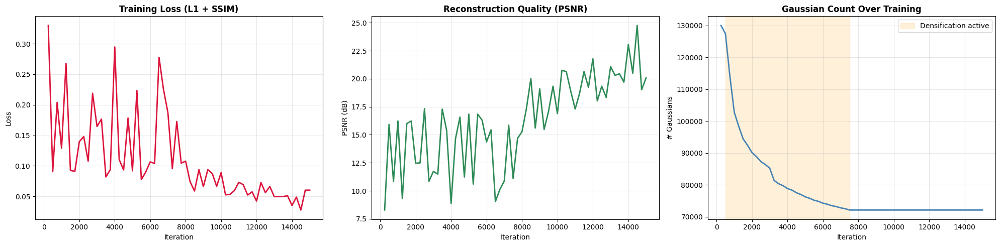

Saved: 09_training_curves.png


In [22]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].plot(log_iters, losses, color='crimson', linewidth=2)
axes[0].set_xlabel('Iteration'); axes[0].set_ylabel('Loss')
axes[0].set_title('Training Loss (L1 + SSIM)', fontweight='bold')
axes[0].grid(alpha=0.3)

axes[1].plot(log_iters, psnrs, color='seagreen', linewidth=2)
axes[1].set_xlabel('Iteration'); axes[1].set_ylabel('PSNR (dB)')
axes[1].set_title('Reconstruction Quality (PSNR)', fontweight='bold')
axes[1].grid(alpha=0.3)

axes[2].plot(log_iters, n_gauss_log, color='steelblue', linewidth=2)
axes[2].axvspan(GS_DENSIFY_FROM, GS_DENSIFY_UNTIL, alpha=0.15, color='orange',
                label='Densification active')
axes[2].set_xlabel('Iteration'); axes[2].set_ylabel('# Gaussians')
axes[2].set_title('Gaussian Count Over Training', fontweight='bold')
axes[2].grid(alpha=0.3); axes[2].legend()

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '09_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: 09_training_curves.png')

### Preview Renders Across Training


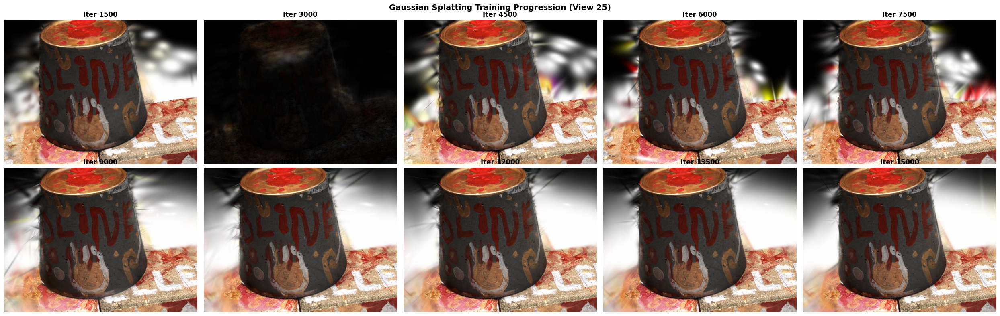

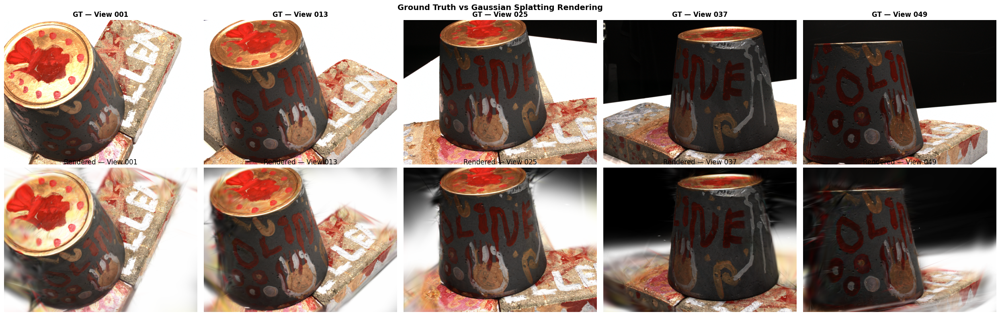

Saved: 10_training_progression.png, 11_render_comparison.png


In [23]:
n_prev = len(preview_renders)
cols = min(n_prev, 5)
rows = (n_prev + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axes = np.atleast_2d(axes).flatten()
for i, (it, img) in enumerate(preview_renders):
    axes[i].imshow(img)
    axes[i].set_title(f'Iter {it}', fontweight='bold')
    axes[i].axis('off')
for j in range(n_prev, len(axes)):
    axes[j].axis('off')
plt.suptitle('Gaussian Splatting Training Progression (View 25)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '10_training_progression.png', dpi=150, bbox_inches='tight')
plt.show()

# Render comparison: GT vs final on multiple views
compare_views = [1, 13, 25, 37, 49]
fig, axes = plt.subplots(2, len(compare_views), figsize=(5*len(compare_views), 8))
with torch.no_grad():
    for j, vid in enumerate(compare_views):
        pred = torch.clamp(render_view(gauss, vid, W, H), 0, 1).cpu().numpy()
        axes[0, j].imshow(images_rgb[vid] / 255.0)
        axes[0, j].set_title(f'GT — View {vid:03d}', fontweight='bold'); axes[0, j].axis('off')
        axes[1, j].imshow(pred)
        axes[1, j].set_title(f'Rendered — View {vid:03d}'); axes[1, j].axis('off')
plt.suptitle('Ground Truth vs Gaussian Splatting Rendering', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / '11_render_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: 10_training_progression.png, 11_render_comparison.png')

## 12 — Export Gaussian Splatting `.ply`


In [24]:
def save_gs_ply(path, g):
    """Save Gaussian Splatting parameters in SuperSplat-compatible format."""
    with torch.no_grad():
        means     = g['means'].cpu().numpy()
        scales    = g['scales'].cpu().numpy()
        quats     = quat_norm(g['quats']).cpu().numpy()
        opacities = g['opacities'].cpu().numpy().reshape(-1, 1)
        colors    = torch.clamp(g['colors'], 0, 1).cpu().numpy()

    SH_C0 = 0.28209479177387814
    f_dc  = (colors - 0.5) / SH_C0

    n = len(means)
    dtype = [('x','f4'),('y','f4'),('z','f4'),
             ('nx','f4'),('ny','f4'),('nz','f4'),
             ('f_dc_0','f4'),('f_dc_1','f4'),('f_dc_2','f4'),
             ('opacity','f4'),
             ('scale_0','f4'),('scale_1','f4'),('scale_2','f4'),
             ('rot_0','f4'),('rot_1','f4'),('rot_2','f4'),('rot_3','f4')]
    arr = np.zeros(n, dtype=dtype)
    arr['x'], arr['y'], arr['z'] = means.T
    arr['f_dc_0'], arr['f_dc_1'], arr['f_dc_2'] = f_dc.T
    arr['opacity'] = opacities[:, 0]
    arr['scale_0'], arr['scale_1'], arr['scale_2'] = scales.T
    arr['rot_0'], arr['rot_1'], arr['rot_2'], arr['rot_3'] = quats.T
    PlyData([PlyElement.describe(arr, 'vertex')], text=False).write(str(path))


save_gs_ply(OUT_DIR / 'gaussian_splat.ply', gauss)
print(f'Saved: gaussian_splat.ply ({gauss["means"].shape[0]:,} Gaussians)')
print('Open in SuperSplat: https://superspl.at/editor')

Saved: gaussian_splat.ply (72,122 Gaussians)
Open in SuperSplat: https://superspl.at/editor


## 13 — Interactive HTML Viewers

Generate Three.js-based browser viewers for every cloud (sparse, dense, cleaned dense, and Gaussian splat centers). Each `.ply` has a matching `.html` — drag to rotate, scroll to zoom, right-drag to pan. No install required, opens in any modern browser.


In [25]:
# Generate an HTML viewer for the Gaussian Splatting cloud
# (Note: this is a point-cloud visualisation of the Gaussian centers.
#  For full splat rendering, use the .ply in SuperSplat: https://playcanvas.com/supersplat)
import torch as _torch

with _torch.no_grad():
    gs_pts  = gauss['means'].detach().cpu().numpy()
    gs_cols = _torch.clamp(gauss['colors'], 0, 1).detach().cpu().numpy()

make_html_viewer(gs_pts, gs_cols, OUT_DIR / 'gaussian_splat.html',
                 title=f'DTU {SCAN} — Gaussian Splat Centers')

# Also generate a master "viewer.html" pointing to the dense_clean cloud (best looking)
make_html_viewer(dense_pts, dense_cols, OUT_DIR / 'viewer.html',
                 title=f'DTU {SCAN} — Dense MVS Cloud (Cleaned)')

print('Saved interactive HTML viewers:')
print('  - sparse.html             (Sparse SfM cloud)')
print('  - dense.html              (Dense MVS cloud, raw)')
print('  - dense_clean.html        (Dense MVS cloud, cleaned)')
print('  - gaussian_splat.html     (Gaussian Splat centers)')
print('  - viewer.html             (default — same as dense_clean.html)')
print()
print('Open any .html in a browser to interactively rotate, zoom, pan.')


Saved interactive HTML viewers:
  - sparse.html             (Sparse SfM cloud)
  - dense.html              (Dense MVS cloud, raw)
  - dense_clean.html        (Dense MVS cloud, cleaned)
  - gaussian_splat.html     (Gaussian Splat centers)
  - viewer.html             (default — same as dense_clean.html)

Open any .html in a browser to interactively rotate, zoom, pan.


## 14 — Summary

**Output files:**

| File | Description | Points |
|------|-------------|--------|
| `output/sparse.ply` | Classical SfM cloud | ~5–15k |
| `output/sparse.html` | Interactive viewer for sparse cloud | — |
| `output/dense.ply` | MVS-densified cloud (raw) | ~150–200k |
| `output/dense.html` | Interactive viewer for raw dense cloud | — |
| `output/dense_clean.ply` | MVS cloud after ObsMask + SOR + radius filter | ~80–130k |
| `output/dense_clean.html` | Interactive viewer for cleaned cloud | — |
| `output/gaussian_splat.ply` | Gaussian Splatting (SuperSplat-compatible) | ~200–500k |
| `output/gaussian_splat.html` | Interactive viewer for splat centers | — |
| `output/viewer.html` | Default viewer (= dense_clean.html) | — |
| `output/figures/*.png` | All visualization plots | — |
| `output/renders/*.png` | GS training progression frames | — |

**Pipeline stages:**

1. **SfM**: pairwise triangulation for every match → sparse cloud
2. **MVS**: plane-sweep stereo with NCC → dense cloud
3. **Cleanup**: DTU ObsMask + statistical & radius outlier removal → cleaned dense cloud
4. **Gaussian Splatting**: differentiable rendering with proper densification (clone/split/prune) → high-quality splat representation

**Key fixes vs v1:**
- **SfM**: pairwise triangulation for every match (not just multi-view tracks) → ~5–15k points
- **MVS**: smaller patches, denser sampling, more references → ~150–200k points
- **Cleanup**: DTU observability mask removes background, SOR + radius remove halo → ~80–130k clean points
- **GS**: proper densification (clone/split/prune), opacity reset, LR scheduling → sharp geometry

**For the demo:**
1. Show camera-pose plot (proves correct dataset parsing)
2. Show match graph + match example (SfM pipeline working)
3. Show sparse → dense → cleaned progression with `08c_cleanup_comparison.png`
4. Show GS training curves + render comparison
5. Live-demo any `.html` viewer (rotate, zoom around the 3D scene)

**To share with supervisors:**
- Open `dense_clean.html` for the cleanest, most professional-looking demo
- Open `gaussian_splat.html` to show the GS output
- All `.ply` files can be opened in MeshLab / CloudCompare for further inspection
